# Imports

In [15]:
import yfinance as yf
import talib
import numpy as np
import pandas as pd


import warnings
warnings.filterwarnings('ignore')
import datetime 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
from collections import defaultdict

# Functions

In [89]:
def get_data(ticker, start = datetime.date(1970, 1, 1), end = datetime.date(2022, 1, 1)):
    """
    This function downloads and returns the stock market data for a given ticker symbol within a specified date range.
    It uses the Yahoo Finance API to fetch the data.

    Args:
        ticker (str): A string representing the stock ticker symbol of the company whose data is to be fetched.
        start (datetime.date): A datetime object representing the start date of the data range to be fetched.
                            Default value is datetime.date(1970, 1, 1).
        end (datetime.date): A datetime object representing the end date of the data range to be fetched.
                         Default value is datetime.date(2022, 1, 1).

    Returns:
    A Pandas DataFrame containing the stock market data for the given ticker symbol and date range.
    If no data is found for the given ticker symbol, a message is printed and None is returned.
    """
    data = yf.download(ticker, start = start, end = end , period = 'max', interval = '1d', progress = False)
    data = data.reset_index().dropna()
    if(len(data) == 0):
        print("No data for ticker: " + ticker)
        return
    return data

def create_indicator_df(data, time_period_multiplier = 1):
    """
    Creates a pandas DataFrame containing various technical indicators based on the input data.
    
    Args:
        data (pandas.DataFrame): A DataFrame containing the financial data (e.g. OHLCV) to be used to compute the indicators.
        time_period_multiplier (int, optional): A multiplier for the time periods of the indicators. Defaults to 1.
    
    Returns:
        pandas.DataFrame: A DataFrame containing the original data and the computed indicators.
    """
    data['upperband'], data['middleband'], data['lowerband'] = talib.BBANDS(data['Adj Close'], timeperiod=(20*time_period_multiplier), nbdevup=2, nbdevdn=2, matype=0)
    data['EMA'] = talib.EMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
    data['HT_TRENDLINE'] = talib.HT_TRENDLINE(data['Adj Close'])
    data['ADXR'] = talib.ADXR(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
    data['macd'], data['macdsignal'], data['macdhist'] = talib.MACD(data['Adj Close'], fastperiod=(12*time_period_multiplier), slowperiod=(26*time_period_multiplier), signalperiod=(9*time_period_multiplier))
    data['RSI'] = talib.RSI(data['Adj Close'], timeperiod=(14*time_period_multiplier))  
    
#     data['DEMA'] = talib.DEMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['KAMA'] = talib.KAMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['MA'] = talib.MA(data['Adj Close'], timeperiod=(30*time_period_multiplier), matype=0)
#     data['MIDPOINT'] = talib.MIDPOINT(data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['SAR'] = talib. SAR(data['High'], data['Adj Close'], acceleration=0.02, maximum=0.2)
#     data['SMA'] = talib.SMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['TEMA'] = talib.TEMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['TRIMA'] = talib.TRIMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['WMA'] = talib.WMA(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['ADX'] = talib.ADX(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['APO'] = talib.APO(data['Adj Close'], fastperiod=(12*time_period_multiplier), slowperiod=(26*time_period_multiplier), matype=0)
#     data['aroondown'], data['aroonup'] = talib.AROON(data['High'], data['Low'], timeperiod=(14*time_period_multiplier))
#     data['AROONOSC'] = talib.AROONOSC(data['High'], data['Low'], timeperiod=(14*time_period_multiplier))
#     data['BOP'] = talib.BOP(data['Open'], data['High'], data['Low'], data['Adj Close'])
#     data['CCI'] = talib.CCI(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['CMO'] = talib.CMO(data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['DX'] = talib.DX(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['MOM'] = talib.MOM(data['Adj Close'], timeperiod=(10*time_period_multiplier))                    
#     data['ROC'] = talib.ROC(data['Adj Close'], timeperiod=(10*time_period_multiplier))
#     data['ULTOSC'] = talib.ULTOSC(data['High'], data['Low'], data['Adj Close'], timeperiod1=(7*time_period_multiplier), timeperiod2=(14*time_period_multiplier), timeperiod3=(28*time_period_multiplier))
#     data['WILLR'] = talib.WILLR(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['OBV'] = talib.OBV(data['Adj Close'], data['Volume'])      
#     data['ADOSC'] = talib.ADOSC(data['High'], data['Low'], data['Adj Close'], data['Volume'],  fastperiod=(3*time_period_multiplier), slowperiod=(10*time_period_multiplier))
#     data['AD'] = talib.AD(data['High'], data['Low'], data['Adj Close'], data['Volume'])
#     data['HT_DCPERIOD'] = talib.HT_DCPERIOD(data['Adj Close'])
#     data['HT_DCPHASE'] = talib.HT_DCPHASE(data['Adj Close'])
#     data['inphase'], data['quadrature'] = talib.HT_PHASOR(data['Adj Close'])        
#     data['sine'], data['leadsine'] = talib.HT_SINE(data['Adj Close'])    
#     data['HT_TRENDMODE'] = talib.HT_TRENDMODE(data['Adj Close'])        
    # for pat in talib.get_function_groups()['Pattern Recognition']:
    #     candlestick_function = getattr(talib, pat)
    #     data[pat] = candlestick_function(data['Open'], data['High'], data['Low'], data['Adj Close'])    
#     data['ATR'] = talib.ATR(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['NATR'] = talib.NATR(data['High'], data['Low'], data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['TRANGE'] = talib.TRANGE(data['High'], data['Low'], data['Adj Close'])

#     data['BETA'] = talib.BETA(data['High'], data['Low'], timeperiod=(5*time_period_multiplier))
#     data['CORREL'] = talib.CORREL(data['High'], data['Low'], timeperiod=(30*time_period_multiplier))
#     data['LINEARREG'] = talib.LINEARREG(data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['LINEARREG_ANGLE'] = talib.LINEARREG_ANGLE(data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['LINEARREG_INTERCEPT'] = talib.LINEARREG_INTERCEPT(data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['LINEARREG_SLOPE'] = talib.LINEARREG_SLOPE(data['Adj Close'], timeperiod=(14*time_period_multiplier))
#     data['STDDEV'] = talib.STDDEV(data['Adj Close'], timeperiod=(5*time_period_multiplier), nbdev=1)
#     data['TSF'] = talib.TSF(data['Adj Close'], timeperiod=(14*time_period_multiplier))
    #data['VAR'] = talib.VAR(data['Adj Close'], timeperiod=(5*time_period_multiplier), nbdev=1)
#     data['MAX'] = talib.MAX(data['Adj Close'], timeperiod=(30*time_period_multiplier))
#     data['MIN'] = talib.MIN(data['Adj Close'], timeperiod=(30*time_period_multiplier))
    #data['Target'] = data['Adj Close'].shift(2)
    return(data.dropna())

def read_ticker_list(ticker_list):
    '''
    Reads a csv file containing a list of stock tickers and returns the list of tickers as a Python list.

    Args:
        ticker_list (str): Name of the csv file containing the list of stock tickers. The csv file should be located in the "Ticker List" directory.

    Returns:
        list: List of stock tickers read from the csv file.
    '''
    ticker_list = pd.read_csv("Ticker List/" + ticker_list).dropna()
    ticker_list = ticker_list['Symbol'].tolist()
    return(ticker_list)

def create_merged_stock_data(ticker_list, shifting_period = 10, threshold_change = 0.15, start = datetime.date(1970, 1, 1), end = datetime.date(2022, 1, 1)):   
    '''
    Returns a merged pandas DataFrame with stock data and calculated indicators for a list of tickers. 
    
    Parameters:
    -----------
    ticker_list : list
        A list of ticker symbols (strings) to retrieve data for.
    shifting_period : int, optional
        Number of days to look ahead. Default is 10.
    threshold_change : float, optional
        Percentage change to filter data frame on. Default is 0.15.
    start : datetime.date, optional
        The start date for the data to be retrieved. Default is datetime.date(1970, 1, 1).
    end : datetime.date, optional
        The end date for the data to be retrieved. Default is datetime.date(2022, 1, 1).
        
    Returns:
    --------
    df : pandas DataFrame
        A merged DataFrame with the stock data and calculated indicators for the tickers.
    ''' 
    list_df = []
    # shifting_period = 10 # Number of days to look ahead
    # threshold_change = 0.15 # Percentage change to filter df on
    for ticker in ticker_list:
        try:
            temp_df = create_indicator_df(get_data(ticker + '.BO', start = start, end = end))
            temp_df['Company Name'] = ticker
            temp_df['Volume'] = temp_df['Volume'].apply(lambda x: np.nan if x == 0 else x)
            temp_df['Shifted Adj Close'] = temp_df['Adj Close'].shift(-shifting_period)
            temp_df['Change'] = temp_df.apply(lambda x: (x['Shifted Adj Close'] - x['Adj Close'])/ x['Adj Close'], axis = 1)
            list_df.append(temp_df.dropna())
            print(ticker)
        except:
            print(ticker)


        
    df = pd.concat(list_df)
    df = df.reset_index(drop=True)
    df['req'] = df['Change'].apply(lambda x: 1 if abs(x) >= threshold_change else 0)
    df['Target'] = df['Change'].apply(lambda x: 1 if x >= 0 else 0)
    return(df)

def create_signal_df(df):    
    """
    Create a dataframe of technical analysis signals for each company in the given dataframe.

    Parameters:
        df (pandas.DataFrame): The input dataframe containing the historical stock data.

    Returns:
        signals_df (pandas.DataFrame): The output dataframe containing the technical analysis signals for each company.
    """
    signals_df = pd.DataFrame()
    list_of_companies = df['Company Name'].unique()
    for c in list_of_companies:
        print(c)
        temp_df = df[df['Company Name'] == c].copy()
        temp_df = temp_df.reset_index(drop = True)
        temp_df['Rolling Average Volume'] = temp_df['Volume'].rolling(30).mean()
        temp_df['Volume Signal'] = temp_df[['Volume', 'Rolling Average Volume']].apply(lambda x: 1 if(x['Volume'] > x['Rolling Average Volume']) else 0, axis = 1)
        
        temp_df['Bollinger Upper Breach Signal'] = temp_df[['Adj Close', 'upperband']].apply(lambda x: 1 if(x['Adj Close'] > x['upperband']) else 0, axis = 1)
        # Bollinger Upperband Crossover
        temp_diff = temp_df['upperband'] < temp_df['Adj Close']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['Bollinger Upperband Crossover'] = temp_diff - temp_diff_forward
        temp_df['Upperband Crossover Signal'] = temp_df['Bollinger Upperband Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['Bollinger Lower Breach Signal'] = temp_df[['Adj Close', 'lowerband']].apply(lambda x: 1 if(x['Adj Close'] < x['lowerband']) else 0, axis = 1)
        temp_df['Bollinger Middle Signal'] = temp_df[['Adj Close', 'middleband']].apply(lambda x: 1 if(x['Adj Close'] < x['middleband']) else 0, axis = 1)
        # Bollinger Middle Crossover
        temp_diff = temp_df['middleband'] < temp_df['Adj Close']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['Bollinger Middleband Crossover'] = temp_diff - temp_diff_forward
        temp_df['Middleband Crossover Signal'] = temp_df['Bollinger Middleband Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['EMA Signal'] = temp_df[['Adj Close', 'EMA']].apply(lambda x: 1 if(x['Adj Close'] > x['EMA']) else 0, axis = 1)
        # EMA Crossover
        temp_diff = temp_df['EMA'] < temp_df['Adj Close']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['EMA Crossover'] = temp_diff - temp_diff_forward
        temp_df['EMA Crossover Signal'] = temp_df['EMA Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['HT Signal'] = temp_df[['Adj Close', 'HT_TRENDLINE']].apply(lambda x: 1 if(x['Adj Close'] > x['HT_TRENDLINE']) else 0, axis = 1)
        # HT Crossover
        temp_diff = temp_df['HT_TRENDLINE'] < temp_df['Adj Close']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['HT Crossover'] = temp_diff - temp_diff_forward
        temp_df['HT Crossover Signal'] = temp_df['HT Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['ADXR Signal'] = temp_df[['ADXR']].apply(lambda x: 1 if (x['ADXR'] > 25) else 0, axis = 1)
        temp_df['macd Signal'] = temp_df[['macd']].apply(lambda x: 1 if (x['macd'] > 0) else 0, axis = 1)
        temp_df['macdhist Signal'] = temp_df[['macdhist']].apply(lambda x: 1 if (x['macdhist'] > 0) else 0, axis = 1)
        # MACD Crossover
        temp_diff = temp_df['macdhist'] < temp_df['macd']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['MACD Crossover'] = temp_diff - temp_diff_forward
        temp_df['MACD Crossover Signal'] = temp_df['MACD Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['RSI Above 70 Signal Then 1 Signal'] = temp_df[['RSI']].apply(lambda x: 1 if (x['RSI'] > 70) else 0, axis = 1)
        # RSI 70 Crossover
        temp_diff = 70 < temp_df['RSI']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['RSI 70 Crossover'] = temp_diff - temp_diff_forward
        temp_df['RSI 70 Crossover Signal'] = temp_df['RSI 70 Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['RSI Above 80 Signal Then 1 Signal'] = temp_df[['RSI']].apply(lambda x: 1 if (x['RSI'] > 80) else 0, axis = 1)
        temp_df['RSI Above 50 Signal'] = temp_df[['RSI']].apply(lambda x: 1 if (x['RSI'] > 50) else 0, axis = 1)
        temp_df['RSI Below 30 Signal Then 1 Signal'] = temp_df[['RSI']].apply(lambda x: 1 if (x['RSI'] < 30) else 0, axis = 1)

        # RSI 30 Crossover
        temp_diff = 30 > temp_df['RSI']
        temp_diff_forward = temp_diff.shift(1)
        temp_df['RSI 30 Crossover'] = temp_diff - temp_diff_forward
        temp_df['RSI 30 Crossover Signal'] = temp_df['RSI 30 Crossover'].apply(lambda x: 1 if x == 1 else 0)
        
        temp_df['RSI Below 20 Signal Then 1 Signal'] = temp_df[['RSI']].apply(lambda x: 1 if (x['RSI'] < 20) else 0, axis = 1)
        temp_df = temp_df.dropna()
        signals_df = pd.concat([signals_df, temp_df],
                                    axis = 0, ignore_index = True)
    # signals_df = backtest_signal_df.dropna()

    for col in ['HT_TRENDLINE', 'EMA', 'upperband', 'middleband', 'lowerband']:
            signals_df[col + '_percentage'] = signals_df[col] / signals_df['Adj Close']
    return(signals_df)

def plot_precision_recall_f1_support(data, class_type):
    '''
    Plots a heatmap for the precision, recall, F1-score, and support of a binary classification model for a specific class.

    Args:
        data (pandas.DataFrame): A DataFrame containing the evaluation metrics for the binary classification model.
            The DataFrame must have the following columns: 'Shifting Period', 'Threshold Change', 'Precision', 'Recall', 'F1-score', 'Support', and 'class'.
        class_type (int): The class to plot the metrics for. Must be either 0 or 1.

    Returns:
        None.

    The function subsets the input DataFrame `data` to get only the rows corresponding to `class_type`, and then plots a heatmap for each of the four 
    evaluation metrics (precision, recall, F1-score, and support) using the seaborn package. The subplots are arranged in a 1x4 grid, and the x-axis 
    and y-axis labels show the shifting period and threshold change, respectively. The cell values are annotated and rounded to two decimal places.
    '''
    # plot a heatmap for class == 1
    data_class = data[data['class'] == class_type]
    # subplot with 1 row and 3 columns
    fig = plt.figure(figsize=(28,5))
    ax1 = fig.add_subplot("141")
    ax2 = fig.add_subplot('142')
    ax3 = fig.add_subplot('143')
    ax4 = fig.add_subplot('144')
    ax = [ax1, ax2, ax3, ax4]

    a = 0
    for feat in ['Precision', 'Recall', 'F1-score', 'Support']:
        # plot 3 subplots using pivot and heatmap
        temp = data_class.pivot(index = 'Shifting Period', columns = 'Threshold Change', values = feat)
        # 
        sns.heatmap(temp, annot = True, fmt = '.2f', cmap = 'Blues', ax = ax[a])
        ax[a].set_title(feat + ' for class ' + str(class_type))

        a += 1
    plt.show()


def plot_ground_truth(data, class_type):
    """
    Plots the ground truth heatmap for a given class type.

    Parameters:
    -----------
    data : List[pd.DataFrame]
        A list of pandas dataframes, where each dataframe corresponds to a shifting period.
    class_type : str
        The name of the class type to plot the ground truth for.

    Returns:
    --------
    None
    """
    sns.heatmap(pd.concat(data).loc[class_type].values.reshape(7,7), annot = True, fmt = '.2f', cmap = 'Blues')
    plt.title("Ground Truth for " + str(class_type))
    plt.xlabel('Threshold Change')
    plt.ylabel('Shifting Period')
    plt.xticks(np.arange(0.5, 7.5, 1), [0.05, 0.08, 0.1, 0.12, 0.15, 0.2, 0.3])
    plt.yticks(np.arange(0.5, 7.5, 1), [5, 7, 10, 13, 16, 20, 30])
    plt.show()

def plot_ground_truth_weighted_average(data_report, data_list, class_type, combinations_list):
    """
    Plots the ground truth heatmap for a given class type, using a weighted average of the accuracy values.

    Parameters:
    -----------
    data_report : pd.DataFrame
        A pandas dataframe containing the support values for each combination of shifting period and threshold change.
    data_list : List[pd.DataFrame]
        A list of pandas dataframes, where each dataframe corresponds to a shifting period and contains the accuracy values
        for each combination of shifting period and threshold change.
    class_type : str
        The name of the class type to plot the ground truth for.
    combinations_list : List[Tuple[int, float]]
        A list of tuples representing the combinations of shifting period and threshold change to include in the plot.
        Each tuple should contain an integer representing the shifting period (5, 7, 10, 13, 16, 20, or 30) and a float
        representing the threshold change (0.05, 0.08, 0.1, 0.12, 0.15, 0.2, or 0.3).

    Returns:
    --------
    None
    """
    temp_df = pd.concat(data_report['Volume Signal'])
    temp_key = []
    for i in combinations_list:
        temp_key.append(i)
        temp_key.append(i)
    temp_df['key'] = temp_key
    temp_df['Shifting Period'] = temp_df['key'].apply(lambda x: x[0])
    temp_df['Threshold Change'] = temp_df['key'].apply(lambda x: x[1])
    support_7_7 = temp_df['Support'].loc[class_type].values.reshape(7,7)
    acc_7_7 = pd.concat(data_list).loc[class_type].values.reshape(7,7)
    weighted_acc_7_7 = np.average(acc_7_7, axis = 1, weights = support_7_7)
    sns.heatmap(weighted_acc_7_7.reshape(-1, 1), annot = True, fmt = '.2f', cmap = 'Blues')
    plt.title("Ground Truth for " + str(class_type))
    plt.xlabel('Ground Truth')
    plt.ylabel('Shifting Period')
    plt.xticks([0.5], [class_type])
    plt.yticks(np.arange(0.5, 7.5, 1), [5, 7, 10, 13, 16, 20, 30])
    plt.show()

# Create Dataset

In [9]:
# create lists of ticker symbols
n50 = read_ticker_list('n50.csv')
n200 = read_ticker_list('n200.csv')
n500 = read_ticker_list('n500.csv')

Creating classification reports for visuals

In [10]:
combinations_list = []
pre_req_value_counts_list = []
signals_value_counts_list = []
pre_req_classification_report = defaultdict(list)
signals_classification_report = defaultdict(list)
# rf_signals_classification_report = {}
# rf_req_classification_report = {}
for sp in [5, 7, 10, 13, 16, 20, 30]:
    for tc in [0.05, 0.08, 0.1, 0.12, 0.15, 0.2, 0.3]:
        combinations_list.append((sp, tc))
        df = create_merged_stock_data(n50, shifting_period = sp, threshold_change = tc)
        signals_df = create_signal_df(df)
        
        pre_req_df = signals_df.copy()
        # cherry picked data which shows a greater change than the threshold
        signals_df = signals_df[signals_df['req'] == 1].copy()

        # create a list of the column names of the signals created
        signals_columns = [col for col in signals_df.columns if(col.endswith('Signal'))]

        pre_req_value_counts_list.append(pre_req_df['Target'].value_counts() / len(pre_req_df))
        tar = pre_req_df['Target']
        for col in signals_columns:
                pre_req_classification_report[col].append(pd.DataFrame(list(precision_recall_fscore_support(tar, pre_req_df[col])),
                                                        index=['Precision', 'Recall', 'F1-score', 'Support']).T.reset_index().rename(columns = {'index': 'class'}))
                
        signals_value_counts_list.append(signals_df['Target'].value_counts() / len(signals_df))
        tar = signals_df['Target']
        for col in signals_columns:
                signals_classification_report[col].append(pd.DataFrame(list(precision_recall_fscore_support(tar, signals_df[col])),
                                                        index=['Precision', 'Recall', 'F1-score', 'Support']).T.reset_index().rename(columns = {'index': 'class'}))


        
        print('Done with combination: ', (sp, tc))

        



        




ACC
ABBOTINDIA
ADANIENT

1 Failed download:
- ADANIGREEN.BO: No data found for this date range, symbol may be delisted
No data for ticker: ADANIGREEN.BO
ADANIGREEN
ADANITRANS
ALKEM
AMBUJACEM
APOLLOHOSP
AUROPHARMA
DMART
BAJAJHLDNG

1 Failed download:
- BANDHANBNK.BO: No data found for this date range, symbol may be delisted
No data for ticker: BANDHANBNK.BO
BANDHANBNK
BERGEPAINT
BIOCON
BOSCHLTD
COLPAL
DLF
DABUR
GAIL
GODREJCP

1 Failed download:
- HDFCAMC.BO: No data found for this date range, symbol may be delisted
No data for ticker: HDFCAMC.BO
HDFCAMC
HAVELLS
HINDPETRO
ICICIGI
ICICIPRULI
IGL

1 Failed download:
- INDUSTOWER.BO: No data found for this date range, symbol may be delisted
No data for ticker: INDUSTOWER.BO
INDUSTOWER
NAUKRI
INDIGO
JUBLFOOD

1 Failed download:
- LTI.BO: No data found, symbol may be delisted
No data for ticker: LTI.BO
LTI
LUPIN
MRF
MARICO
MUTHOOTFIN
NMDC
PETRONET
PIDILITIND
PEL
PGHH
PNB

1 Failed download:
- SBICARD.BO: No data found for this date range, sym

Creating Visuals

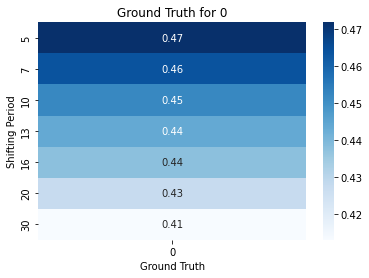

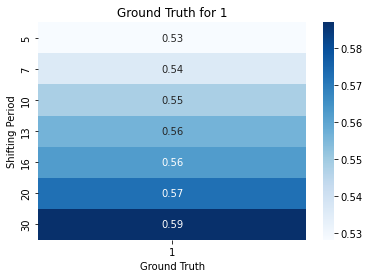

In [91]:
# Ground truth for base dataset
plot_ground_truth_weighted_average(pre_req_classification_report, pre_req_value_counts_list, 0, combinations_list)
plot_ground_truth_weighted_average(pre_req_classification_report, pre_req_value_counts_list, 1, combinations_list)

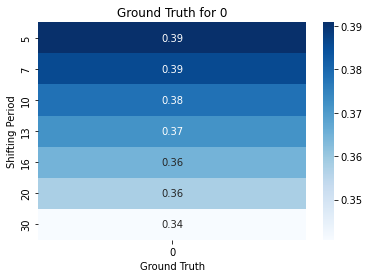

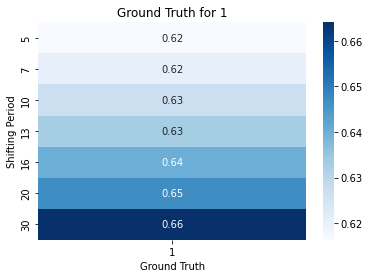

In [90]:
# Ground truth for high volatility dataset
plot_ground_truth_weighted_average(signals_classification_report, signals_value_counts_list, 0, combinations_list)
plot_ground_truth_weighted_average(signals_classification_report, signals_value_counts_list, 1, combinations_list)

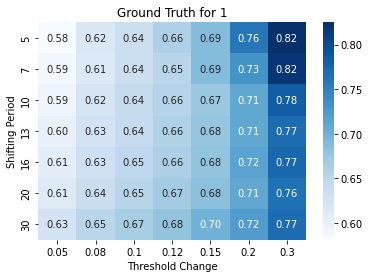

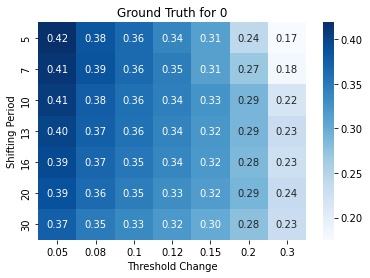

In [82]:
# Detailed ground truth for high volatility dataset
plot_ground_truth(signals_value_counts_list, 1)
plot_ground_truth(signals_value_counts_list, 0)


Volume Signal


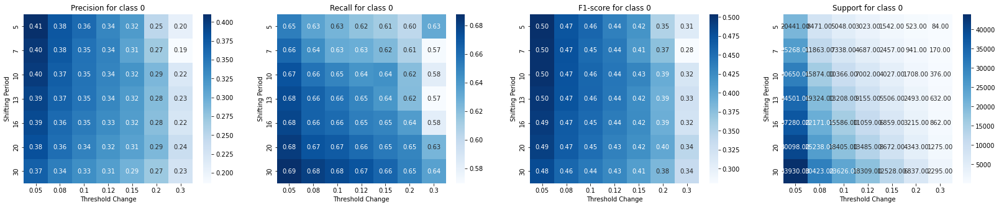

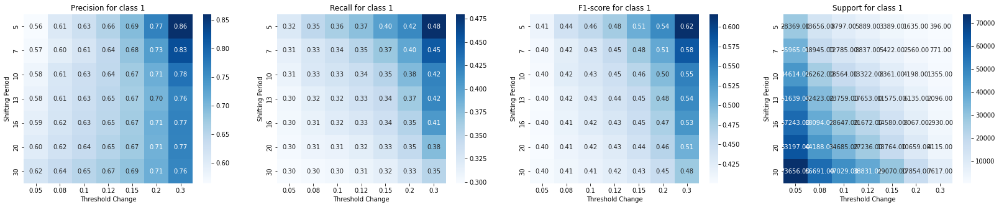




Bollinger Upper Breach Signal


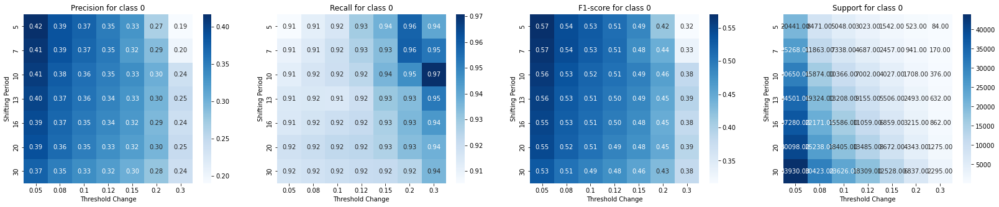

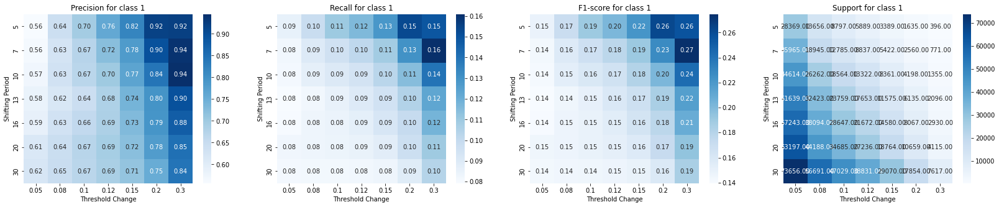




Upperband Crossover Signal


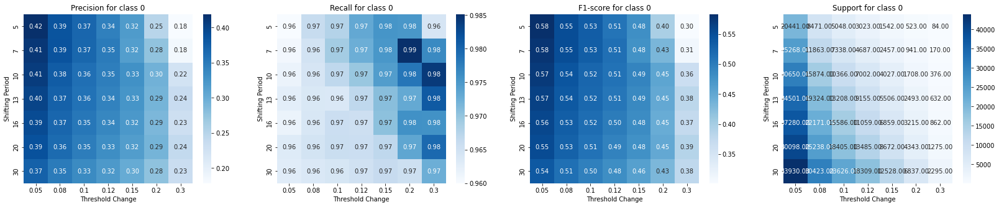

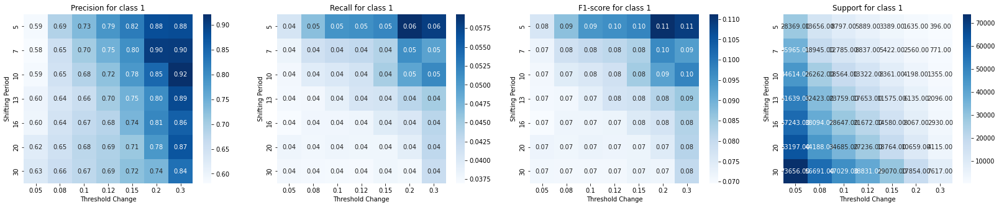




Bollinger Lower Breach Signal


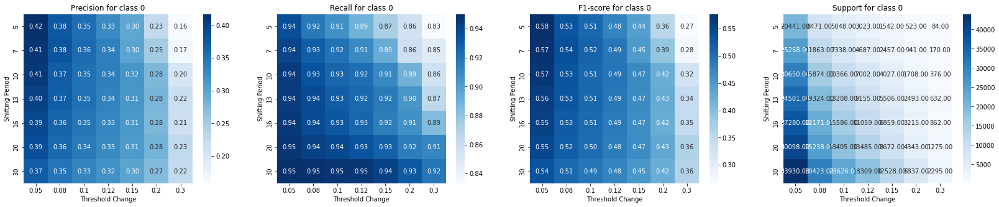

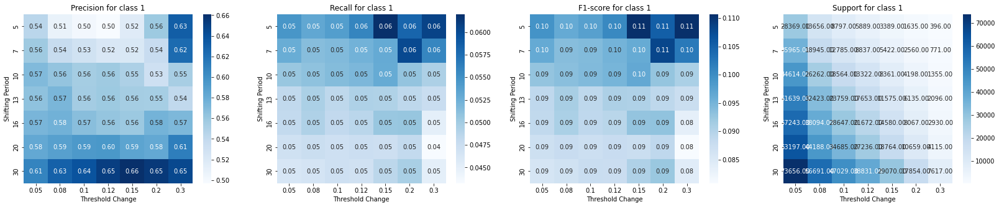




Bollinger Middle Signal


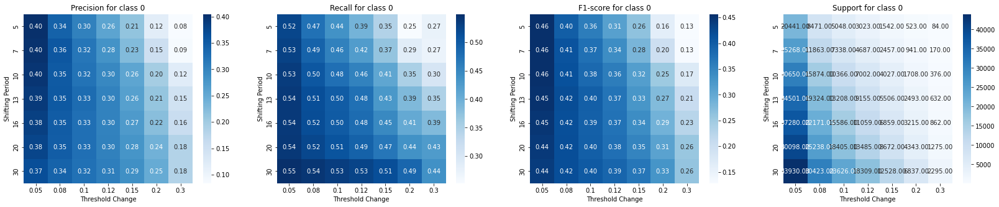

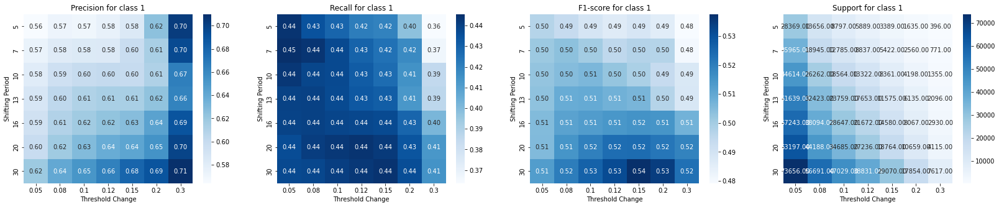




Middleband Crossover Signal


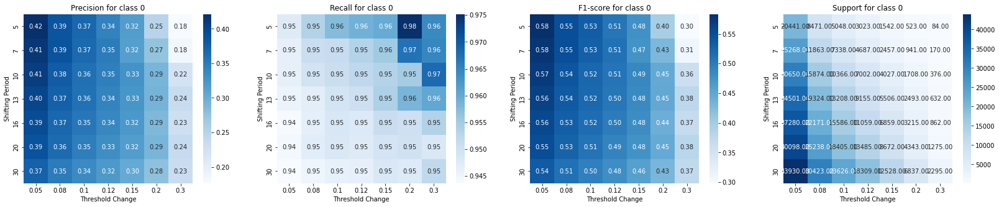

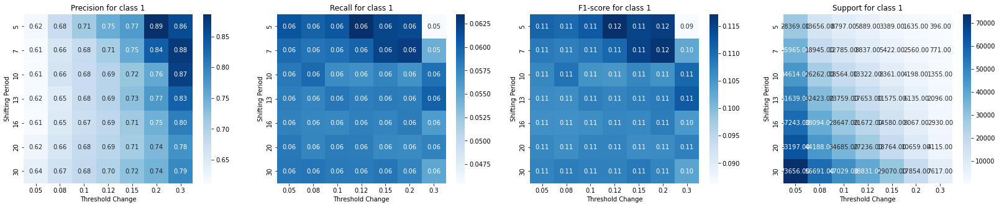




EMA Signal


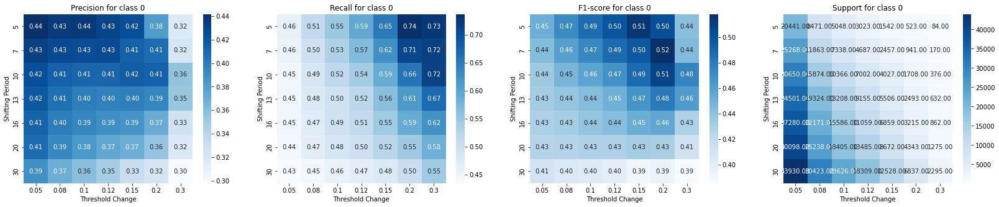

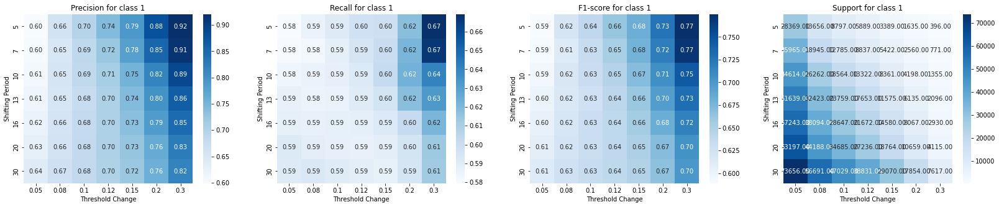




EMA Crossover Signal


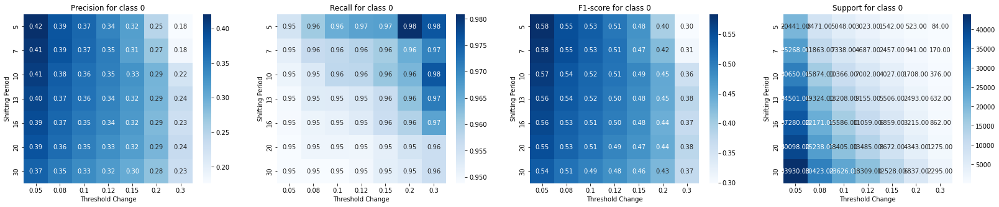

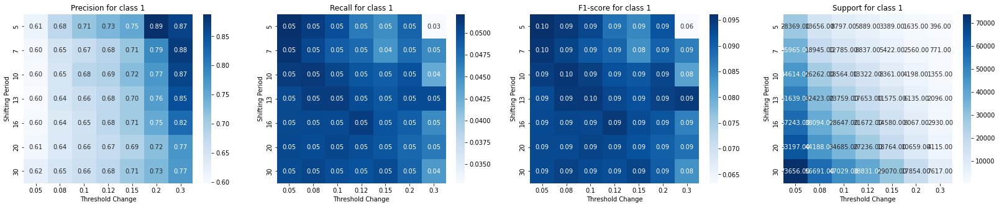




HT Signal


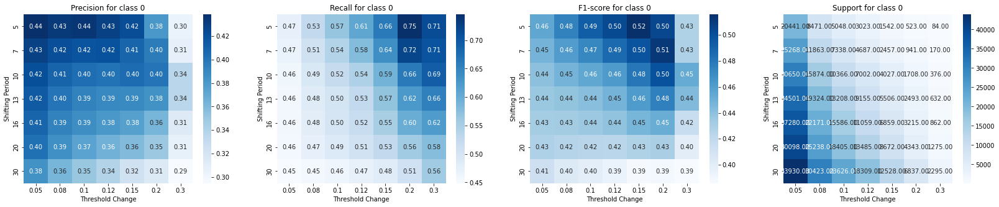

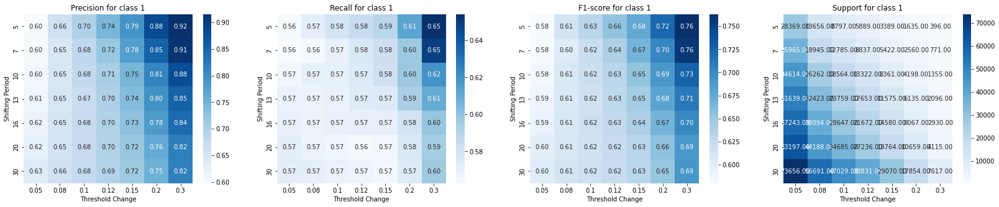




HT Crossover Signal


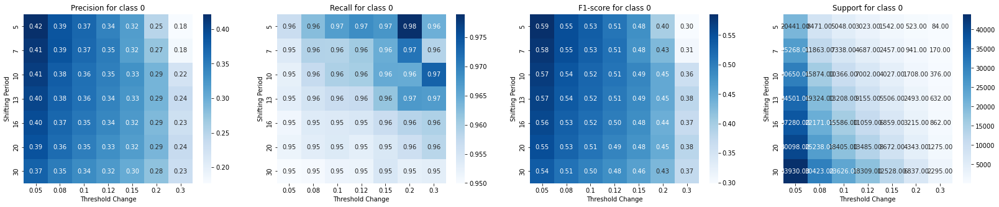

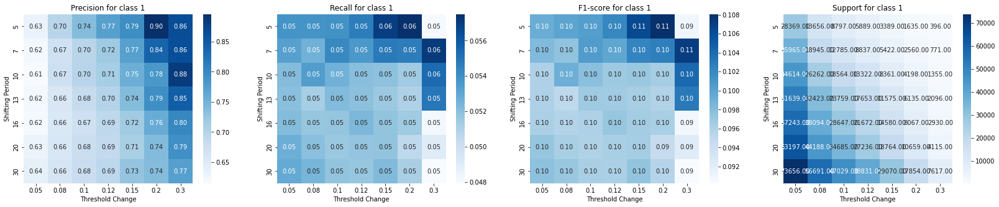




ADXR Signal


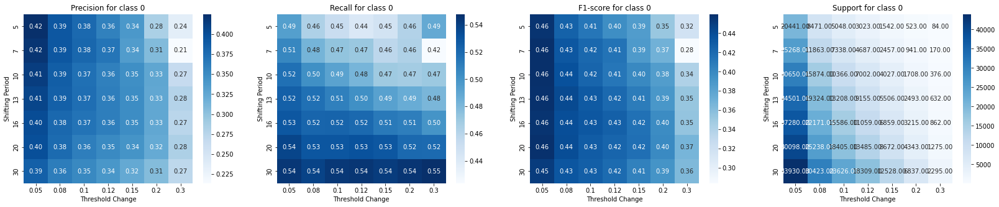

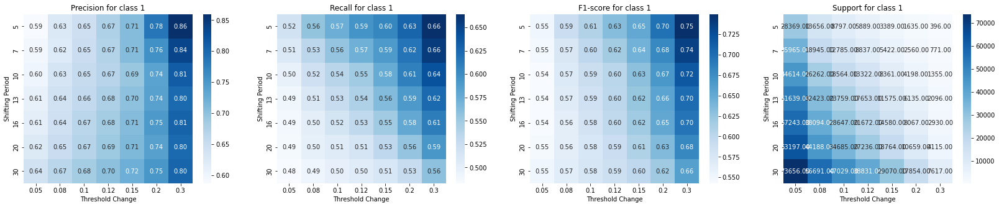




macd Signal


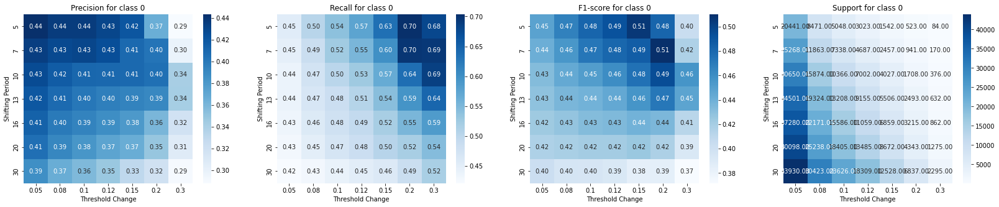

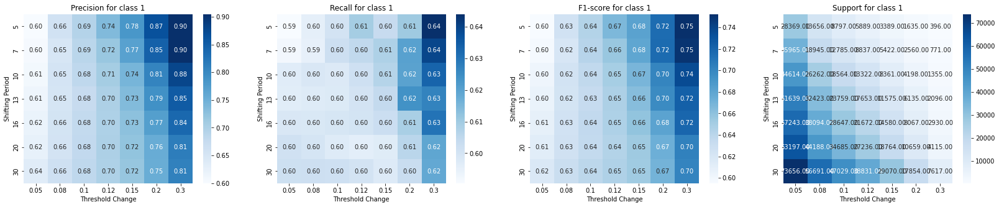




macdhist Signal


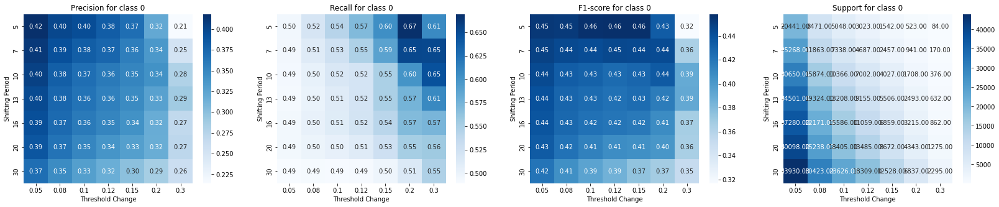

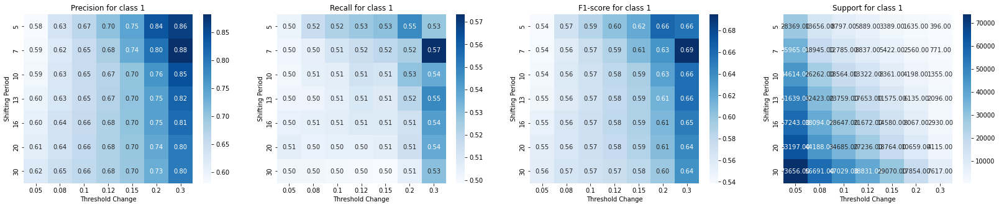




MACD Crossover Signal


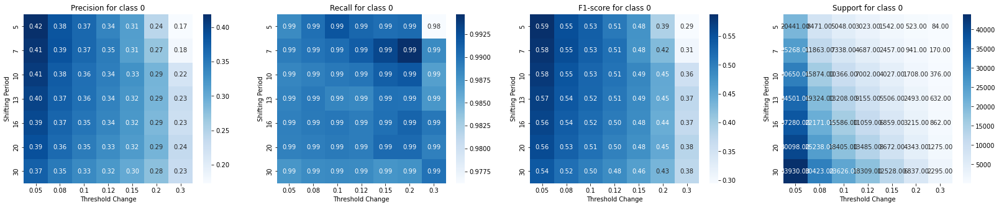

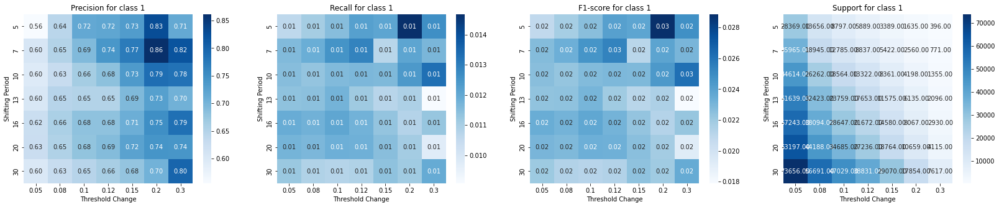




RSI Above 70 Signal Then 1 Signal


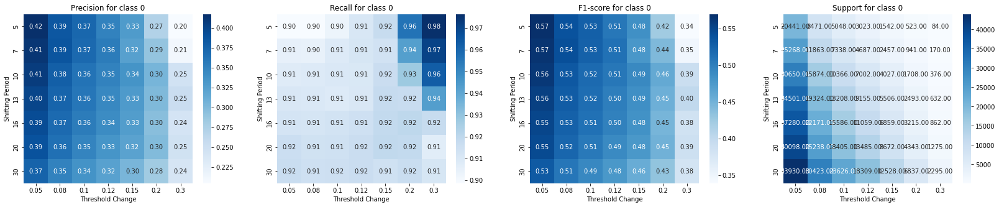

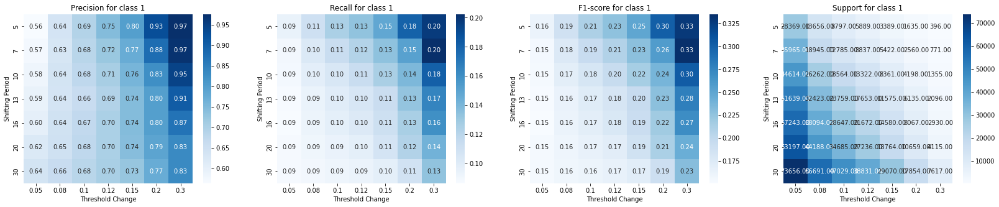




RSI 70 Crossover Signal


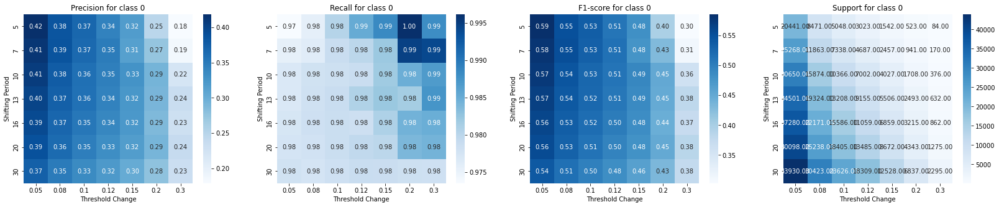

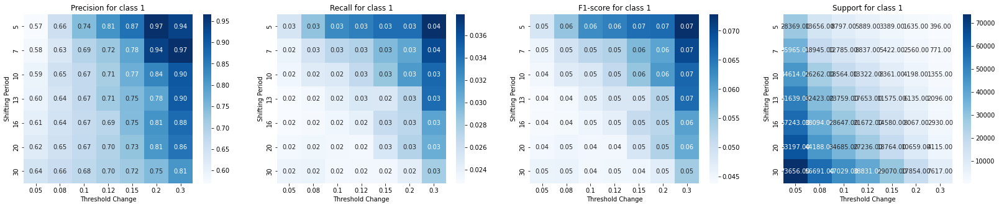




RSI Above 80 Signal Then 1 Signal


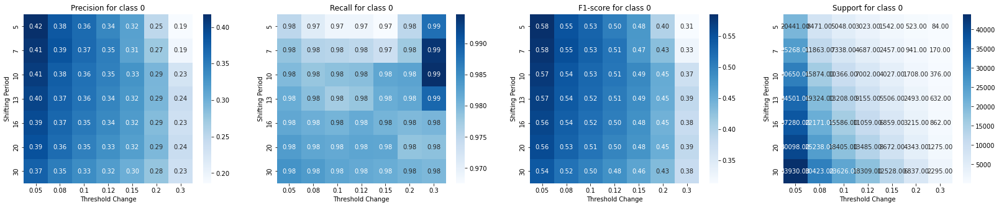

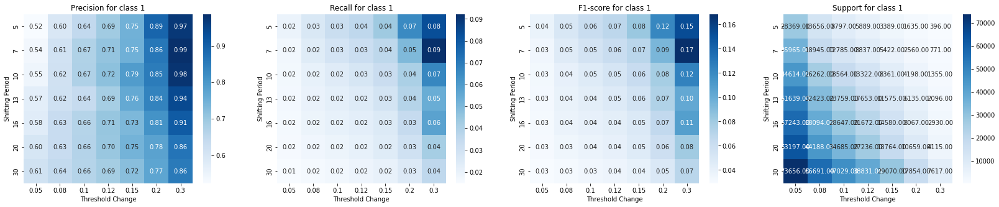




RSI Above 50 Signal


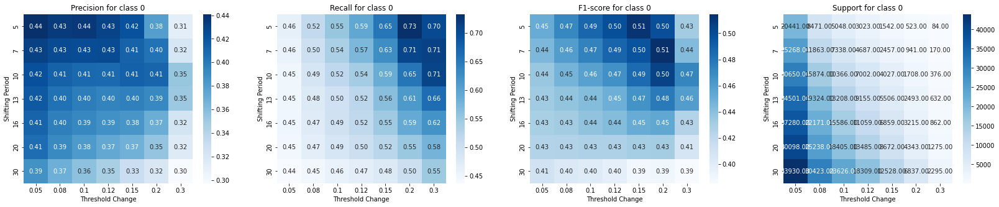

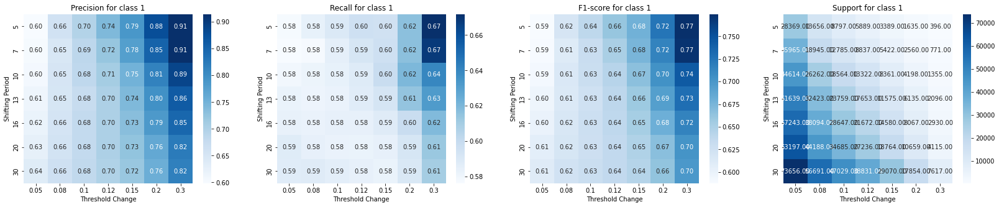




RSI Below 30 Signal Then 1 Signal


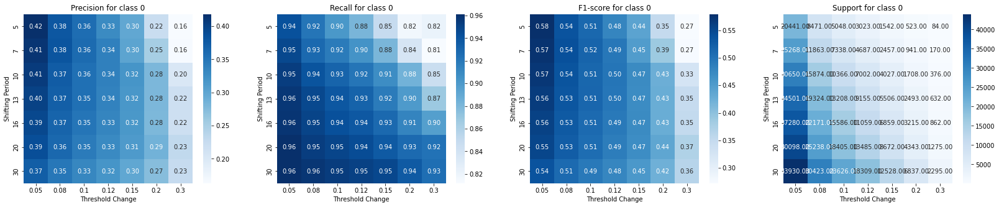

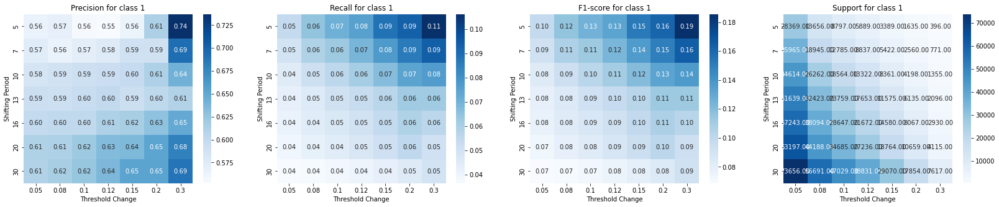




RSI 30 Crossover Signal


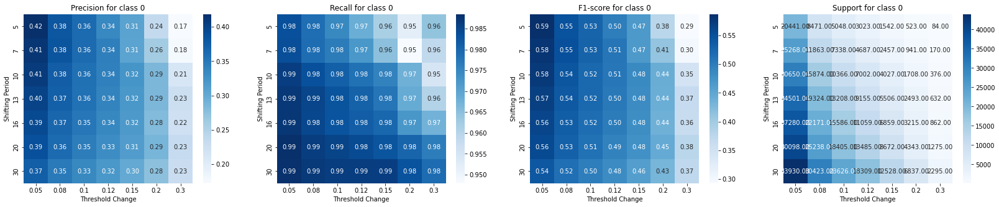

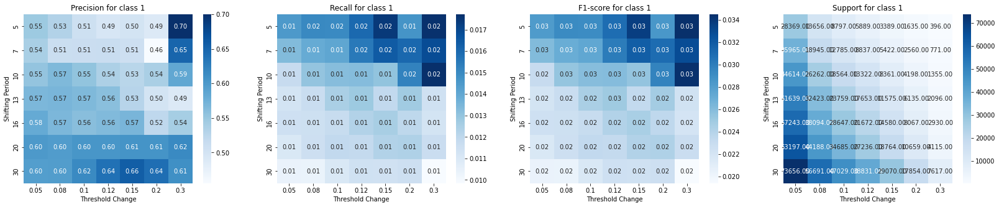




RSI Below 20 Signal Then 1 Signal


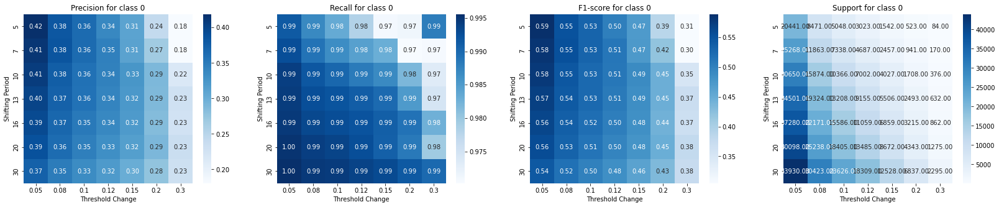

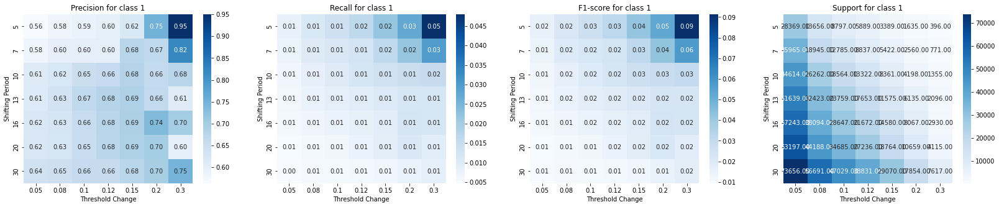

In [51]:
# Heatmaps for various indicators for high volatility data
for col in signals_columns:
    temp_df = pd.concat(signals_classification_report[col])
    temp_key = []
    for i in combinations_list:
        temp_key.append(i)
        temp_key.append(i)
    temp_df['key'] = temp_key
    temp_df['Shifting Period'] = temp_df['key'].apply(lambda x: x[0])
    temp_df['Threshold Change'] = temp_df['key'].apply(lambda x: x[1])
    print(col)
    plot_precision_recall_f1_support(temp_df, 0)
    plot_precision_recall_f1_support(temp_df, 1)
    print('\n\n')    
      


Volume Signal


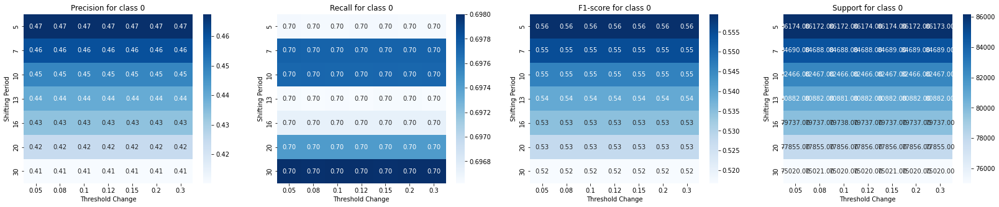

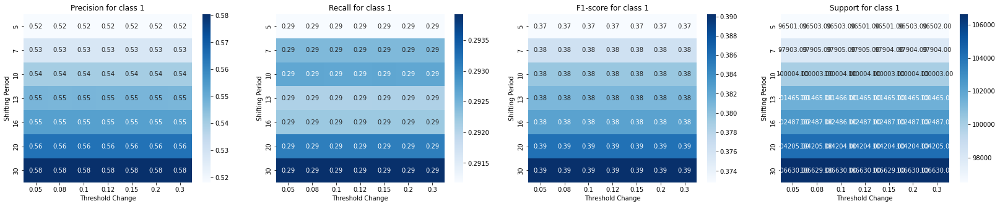




Bollinger Upper Breach Signal


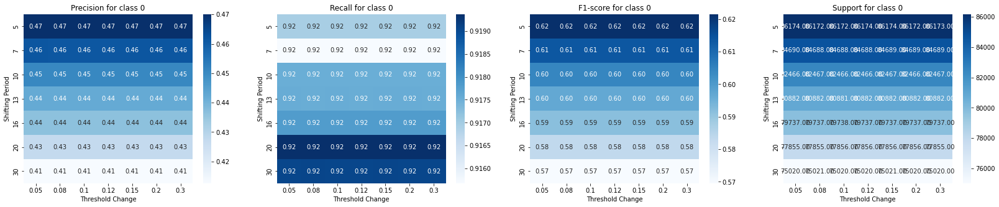

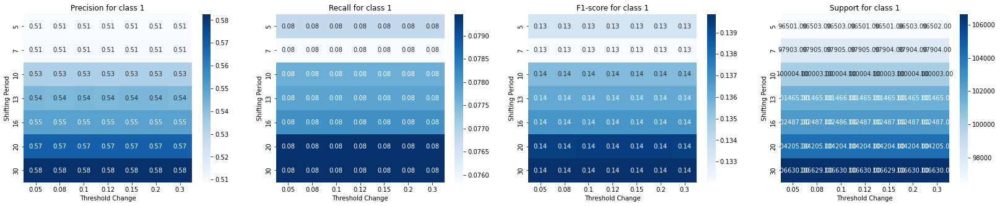




Upperband Crossover Signal


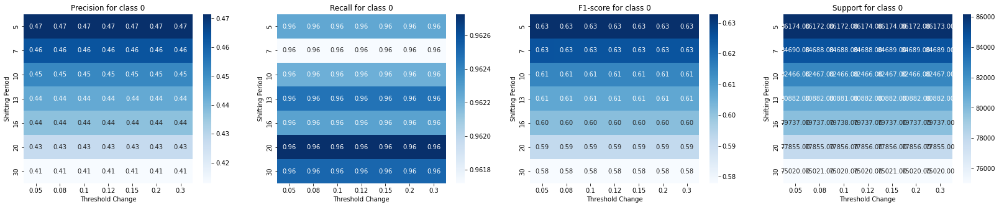

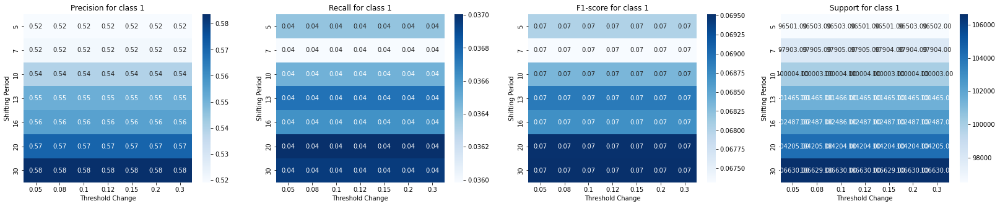




Bollinger Lower Breach Signal


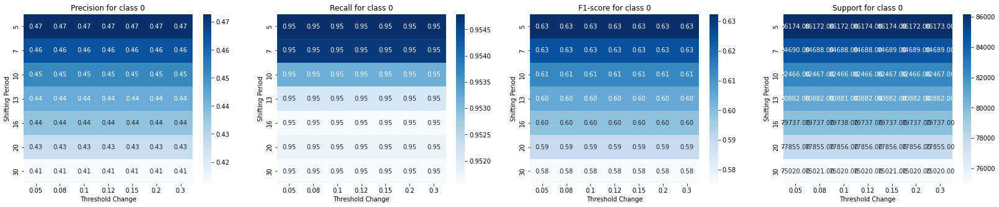

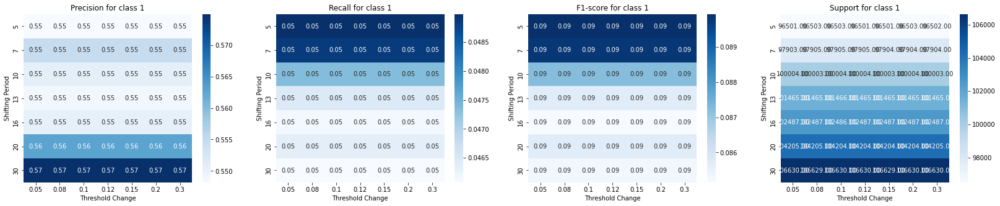




Bollinger Middle Signal


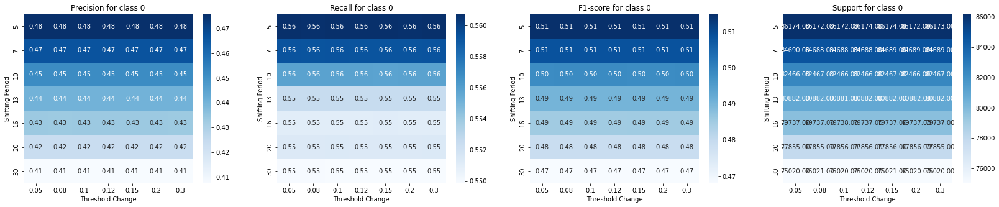

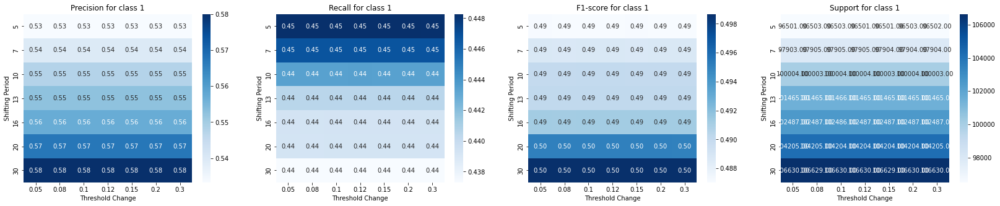




Middleband Crossover Signal


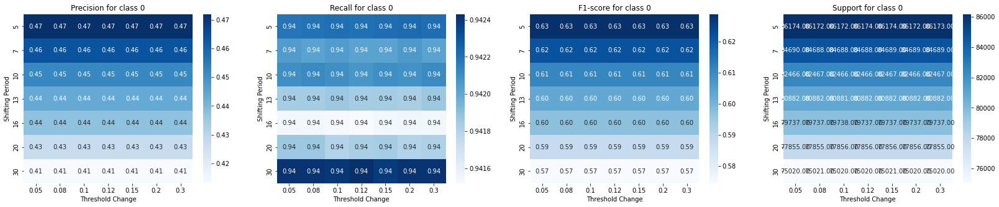

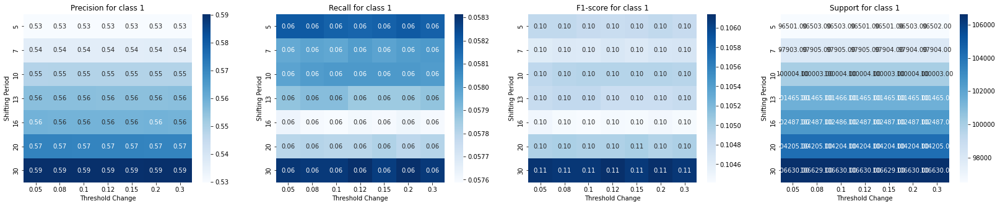




EMA Signal


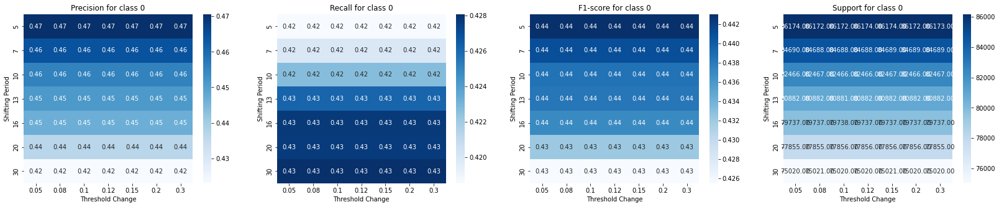

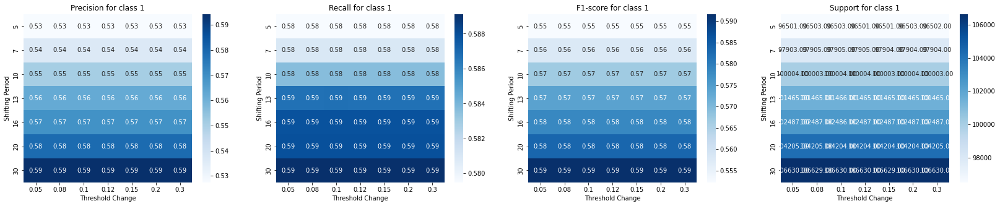




EMA Crossover Signal


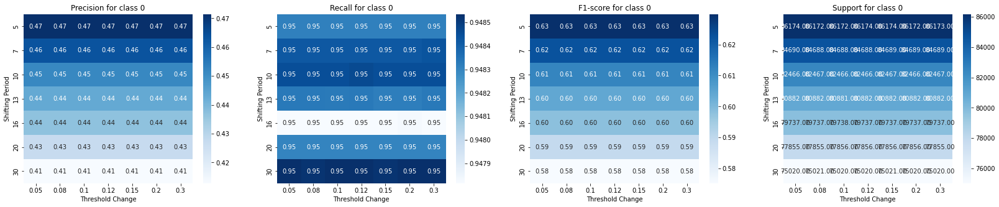

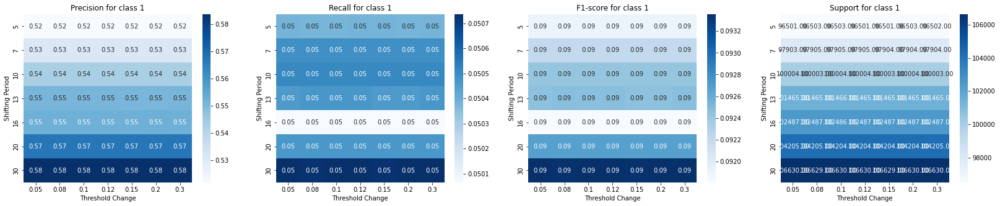




HT Signal


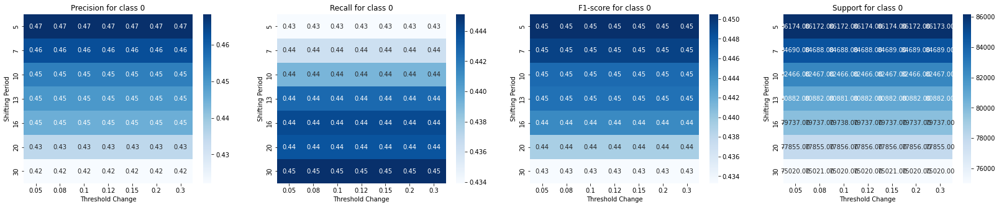

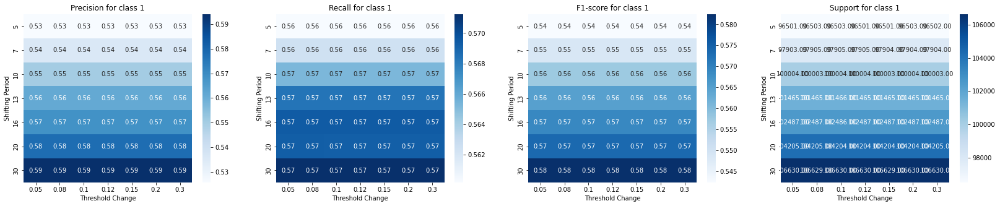




HT Crossover Signal


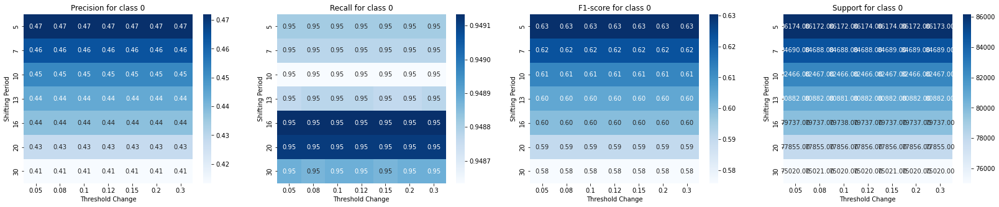

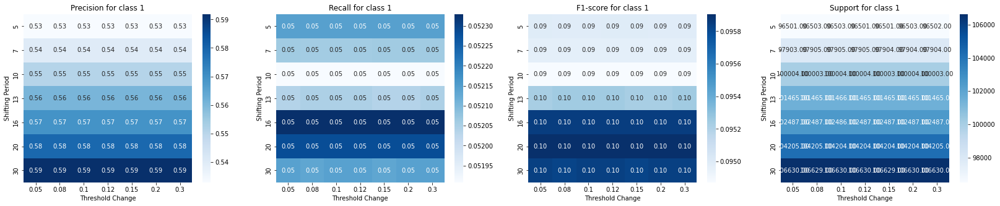




ADXR Signal


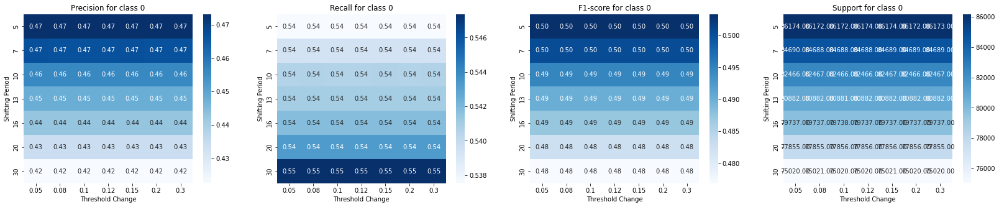

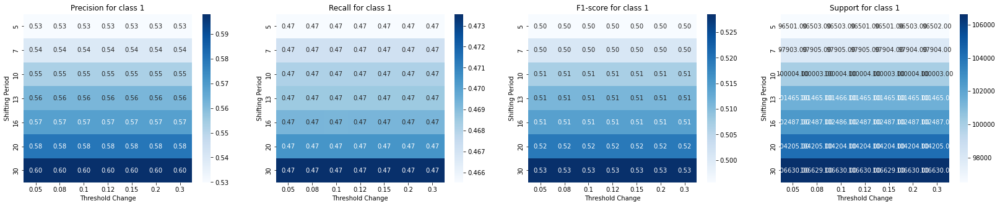




macd Signal


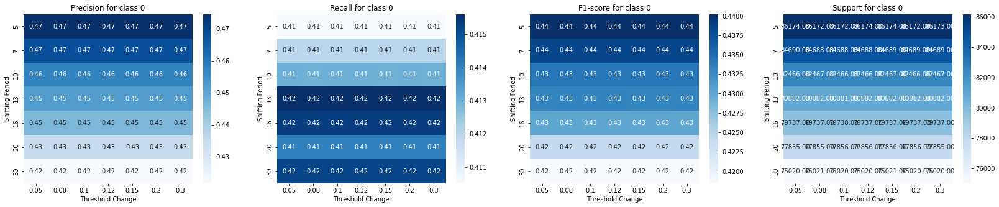

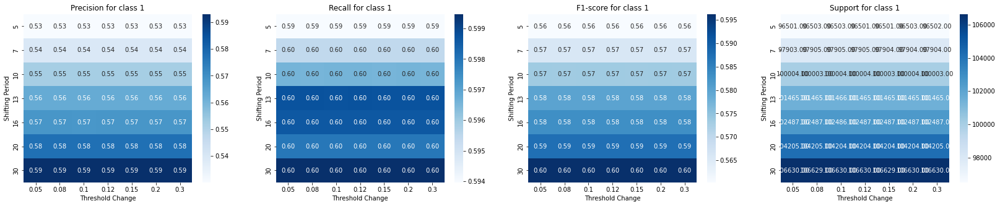




macdhist Signal


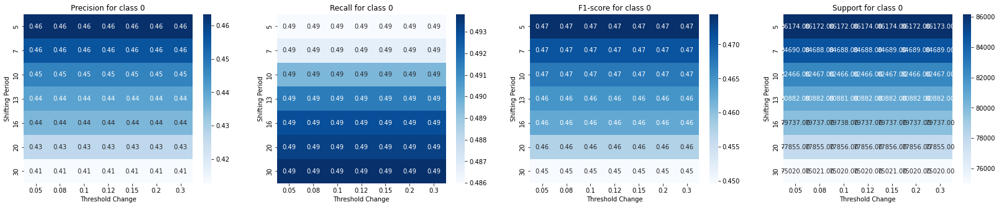

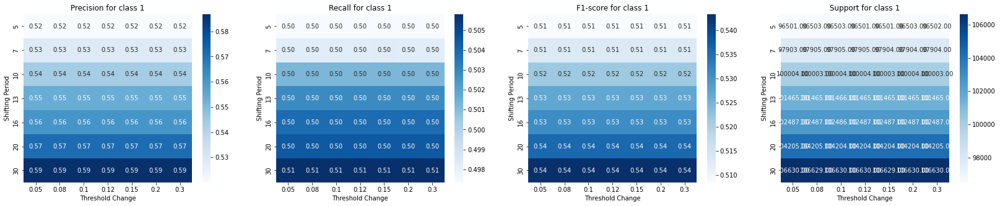




MACD Crossover Signal


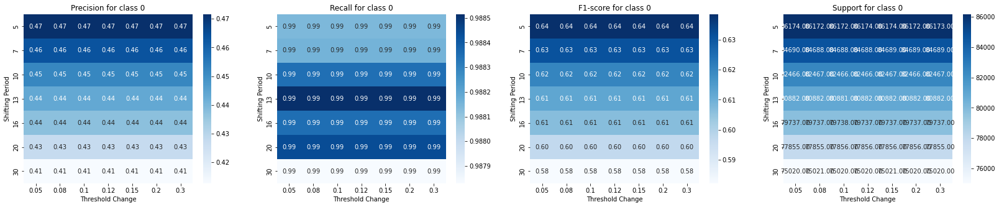

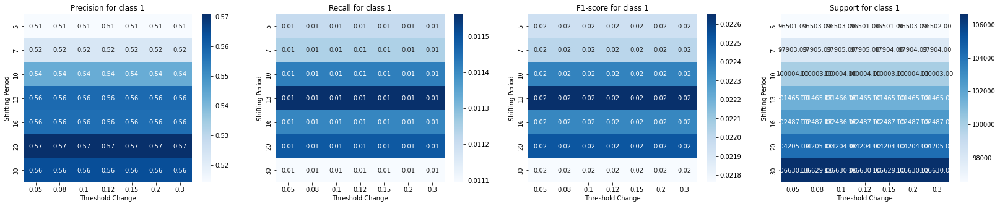




RSI Above 70 Signal Then 1 Signal


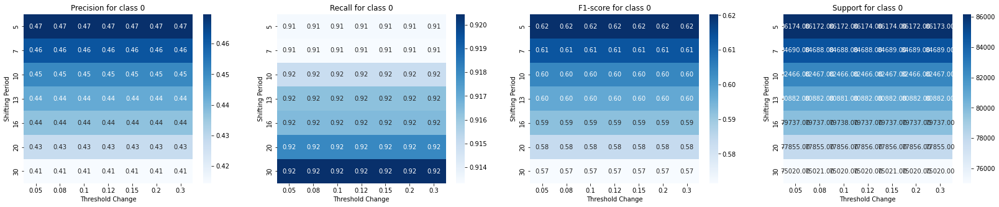

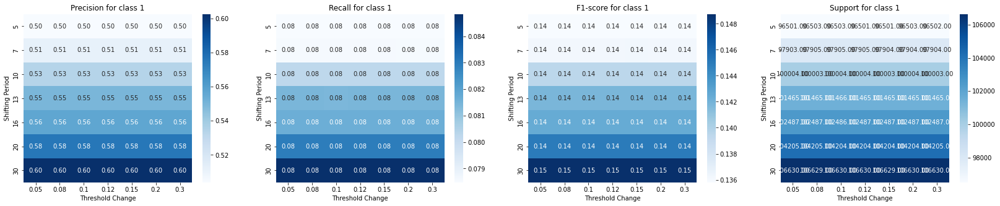




RSI 70 Crossover Signal


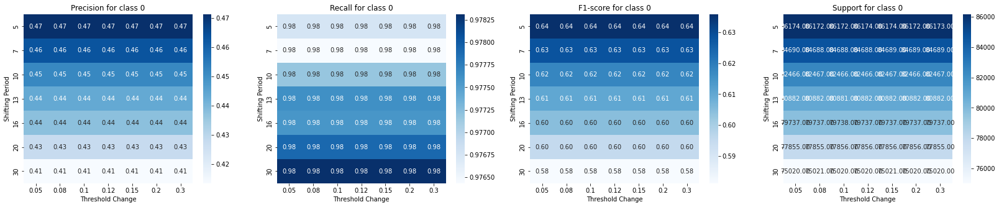

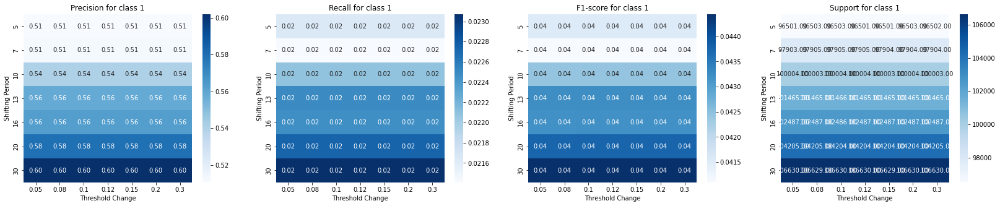




RSI Above 80 Signal Then 1 Signal


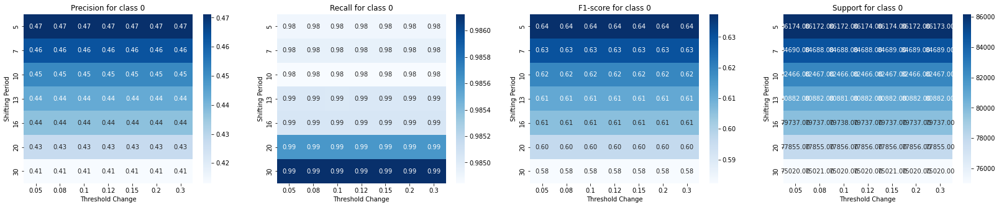

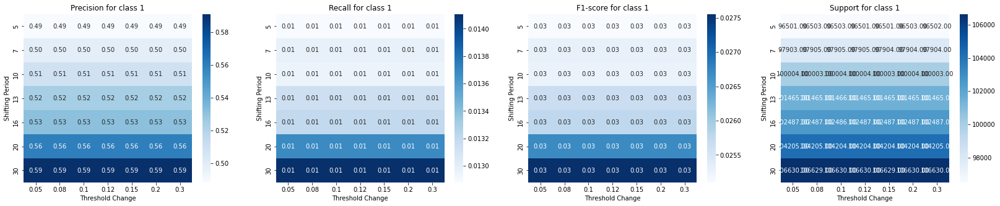




RSI Above 50 Signal


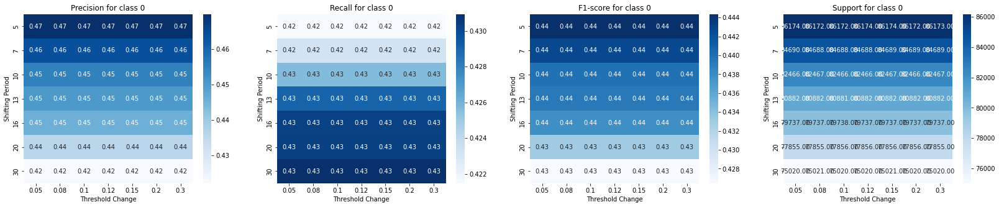

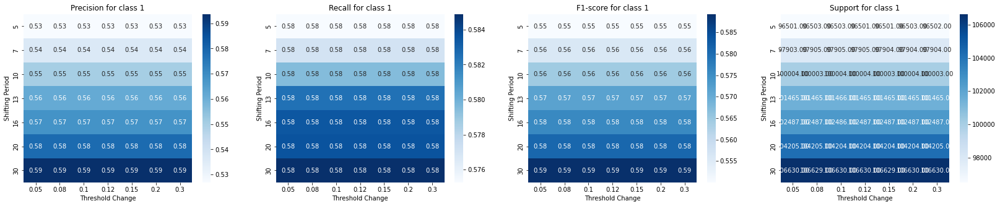




RSI Below 30 Signal Then 1 Signal


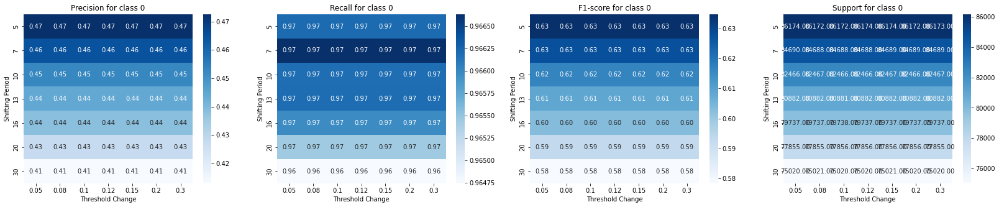

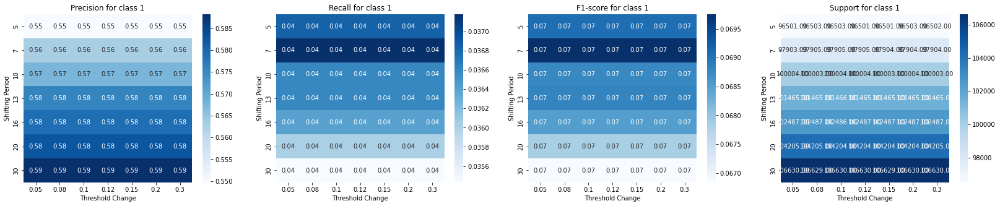




RSI 30 Crossover Signal


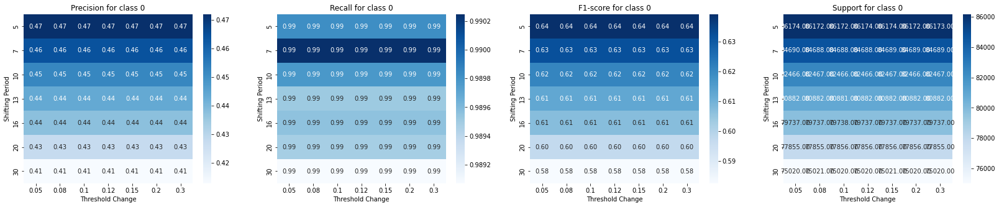

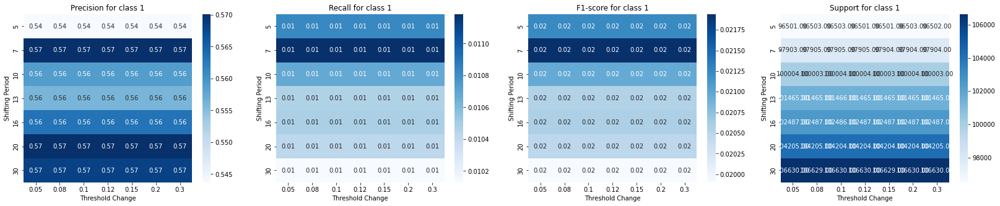




RSI Below 20 Signal Then 1 Signal


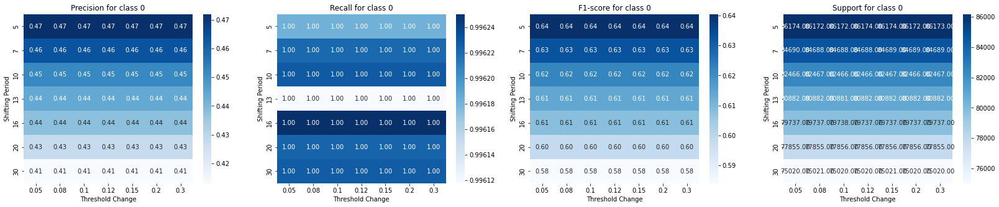

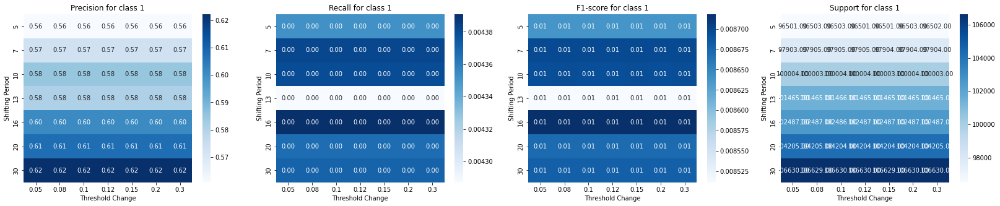

In [52]:


# for col in signals_columns:
#     temp_df = pd.concat(pre_req_classification_report[col])
#     temp_key = []
#     for i in combinations_list:
#         temp_key.append(i)
#         temp_key.append(i)
#     temp_df['key'] = temp_key
#     temp_df['Shifting Period'] = temp_df['key'].apply(lambda x: x[0])
#     temp_df['Threshold Change'] = temp_df['key'].apply(lambda x: x[1])
#     print(col)
#     plot_precision_recall_f1_support(temp_df, 0)
#     plot_precision_recall_f1_support(temp_df, 1)
#     print('\n\n')    
    
      
